<a href="https://colab.research.google.com/github/FabioMMaia/face_recognition_4models/blob/main/Exploratorio_e_Volumetrias.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow import keras
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
import cv2
from PIL import Image
from skimage import data, exposure
from skimage.feature import hog,local_binary_pattern
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from numpy.random import seed
import pickle
from tqdm import tqdm

import pytz
from datetime import datetime
from collections import Counter
import math

from sklearn.metrics import accuracy_score

import warnings
warnings.filterwarnings('ignore')

tqdm.pandas()

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import sys
sys.path.append('/content/drive/MyDrive/Projeto ML/2022/Aprendizado de Maquinas/Projeto/Pipeline/Modelos_Implementações')

import MLP as mlp # multilayer perceptron
import Multinomial_LogReg # regressão logística com alpha variavel (bissecao)
import R_LOG as r_log # regressão logística com alpha fixo
import SVM_OVR # SVM one-versus-rest
import ANN

In [5]:
config_dir = '/content/drive/MyDrive/Projeto ML/2022/Aprendizado de Maquinas/Projeto/Pipeline/config/'
model_save_dir = '/content/drive/MyDrive/Projeto ML/2022/Aprendizado de Maquinas/Projeto/Pipeline/model/'
erro_dir = '/content/drive/MyDrive/Projeto ML/2022/Aprendizado de Maquinas/Projeto/Pipeline/error/'
log_dir = '/content/drive/MyDrive/Projeto ML/2022/Aprendizado de Maquinas/Projeto/Pipeline/log/'

In [6]:
n_classes=20
ref = 'HOG' 
tag= 'hog' + '_'+ str(n_classes) + '_classes'

with open(r'/content/drive/MyDrive/Projeto ML/2022/Aprendizado de Maquinas/Projeto/Pipeline/Data/X_y_' + tag +'.obj', "rb") as f:
    X,y = pickle.load(f)

In [7]:
with open(model_save_dir + 'hog_20_classes_melhor' +'.obj', 'rb') as fp:
  classifier = pickle.load( fp)

In [19]:
classifier

In [9]:
def train_test_separation(X, y):

  # transformar categorias em one-hot-encoding: Saída
  saida = y.max()+1
  print("Quantidade de pessoas:",saida)
  target = keras.utils.to_categorical(y, saida)
  
  x_train, x_test, y_train_n, y_test_n = train_test_split(X, y, test_size=0.30, random_state=42,stratify=y)

  y_train = target[y.index.isin(y_train_n.index).flatten(),:]
  y_test= target[y.index.isin(y_test_n.index).flatten(),:]

  assert y_train.shape[0]== y_train_n.shape[0]
  assert y_test.shape[0]== y_test_n.shape[0]

  print('Shape',x_train.shape, x_test.shape, y_train.shape, y_test.shape,  y_train_n.shape, y_test_n.shape)

  return x_train, x_test, y_train_n, y_test_n, y_train, y_test

def apply_PCA(n_pca, x_train,x_test, norm_entry=False):

  if norm_entry:
    x_train = (x_train - x_train.mean(axis=0))/  x_train.std(axis=0)
    x_test = (x_test - x_train.mean(axis=0))/  x_train.std(axis=0)
  else:
    pass

  pca = PCA(n_components=n_pca, random_state=42)
  pca.fit(x_train)

  print('variancia explicada:', sum(pca.explained_variance_ratio_))
  x_train_pca = pca.transform(x_train)
  x_test_pca = pca.transform(x_test)

  x_train_pca_norm = (x_train_pca - x_train_pca.mean(axis=0))/  x_train_pca.std(axis=0)
  x_test_pca_norm = (x_test_pca - x_train_pca.mean(axis=0))/  x_train_pca.std(axis=0)

  return x_train_pca_norm, x_test_pca_norm

In [145]:
X_train, X_test, y_train_n, y_test_n, y_train, y_test = train_test_separation(X,y)

X_train_pca, X_test_pca = apply_PCA(n_pca=5, x_train=X_train, x_test=X_test)

print(X_train_pca.shape, X_test_pca.shape )

Quantidade de pessoas: 20
Shape (415, 4608) (178, 4608) (415, 20) (178, 20) (415,) (178,)
variancia explicada: 0.11533951427713032
(415, 5) (178, 5)


In [146]:
classifier.fit(X_train_pca,y_train_n)

100%|██████████| 20/20 [00:09<00:00,  2.21it/s]


In [147]:
from sklearn.metrics import accuracy_score

accuracy_score(classifier.predict(X_train_pca), y_train_n)

0.8385542168674699

In [148]:
accuracy_score(classifier.predict(X_test_pca), y_test_n)

0.17415730337078653

100%|██████████| 202600/202600 [00:00<00:00, 519508.00it/s]


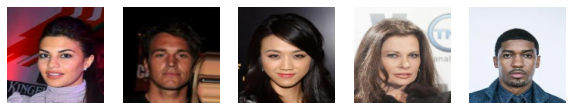

In [149]:
def generate_image_db(keep_images):
  import zipfile
  from skimage.transform import resize


  imagens_path = '/content/drive/MyDrive/Projeto ML/2022/Aprendizado de Maquinas/Projeto/CelebA/img_align_celeba.zip'
  imgzip = zipfile.ZipFile(imagens_path)
  inflist = imgzip.infolist()
  all_images = {}

  for f in tqdm(inflist):
    file_name = f.filename.split('/')[1]
    if file_name in keep_images:
      if '.jpg' in file_name:
        ifile = imgzip.open(f)
        img = Image.open(ifile)
        img_resize = resize(np.array(img), (128, 128))
        all_images[file_name] = [img_resize]

  return all_images

def plt_samples(imgs):
  # faces que foram reconhecidas pelo viola jones
  fig, axes = plt.subplots(1,5, figsize=(10,10))

  imgs= pd.DataFrame(imgs)

  for (i,row), ax in zip(imgs.head(8).iterrows(), axes.ravel()): 
    ax.axis('off')
    ax.imshow(row[0], cmap=plt.cm.gray)

def visualize_5photos(y):
  amostra= generate_image_db(y.sample(5).index)
  amostra_df = pd.DataFrame(amostra).T.reset_index()
  plt_samples(amostra_df)

visualize_5photos(y)

In [150]:
def print_resultados(analise_pred, acertos=True):

  for i,row in analise_pred.query('acerto==@acertos').head(20).iterrows():
    fig, ax = plt.subplots(1,3, figsize=(10,6))

    ax[0].axis('off')
    ax[0].imshow(row['images'], cmap=plt.cm.gray)
    ax[0].set_title('image')

    # real = aux[aux['class']==row['class']]['images'][0]
    # predicted = aux[aux['class']==row['class_pred']]['images'][0]
    classe_real = row['classe_n']
    classe_pred = row['classe_n_pred']

    real = db_treino.query('classe_n==@classe_real')['images'][0]
    predicted = db_treino.query('classe_n==@classe_pred')['images'][0]

    ax[1].axis('off')
    ax[1].imshow(real, cmap=plt.cm.gray)
    ax[1].set_title('real: person:{}|{}'.format(row['classe_n'], row['classe_oficial']))

    ax[2].axis('off')
    ax[2].imshow(predicted, cmap=plt.cm.gray)
    ax[2].set_title('pred :person:{}'.format(row['classe_n_pred']))

    plt.show()

def get_labels():
  labels= pd.read_csv(r'/content/drive/MyDrive/Projeto ML/2022/Aprendizado de Maquinas/Projeto/Pipeline/Data/identity_CelebA.txt', header=None)
  labels.rename(columns={0:'id'},inplace=True)
  labels['class'] = labels['id'].apply(lambda x:x.split()[1])
  labels['class'] = labels['class'].astype(int)
  labels['image'] = labels['id'].apply(lambda x:x.split()[0])
  labels.set_index('image', inplace=True)

  print('Total de {} imagens com {} classes'.format(labels.shape[0], len(labels['class'].unique())))

  return labels

labels = get_labels()

Total de 202599 imagens com 10177 classes


In [151]:
def evalute_classifier_preds(y_n, X,save_as_db_treino=False):
    eval_img  = generate_image_db(y_n.index)

    eval_db = pd.DataFrame(y_n).rename(columns={'class':'classe_n'}).merge(labels, left_index=True, right_index=True, how='left').rename(columns={'class':'classe_oficial'})
    eval_db = eval_db.merge(pd.DataFrame(eval_img).T, left_index=True, right_index=True, how='left').rename(columns={0:'images'})
    eval_db['classe_n_pred'] = classifier.predict(X)
    eval_db['acerto'] = eval_db['classe_n']== eval_db['classe_n_pred']

    if save_as_db_treino:
      global db_treino
      db_treino = eval_db.copy()

    print('acertos')
    print_resultados(eval_db, acertos=True)

    print('erros')
    print_resultados(eval_db, acertos=False)

100%|██████████| 202600/202600 [00:05<00:00, 36264.41it/s]


acertos


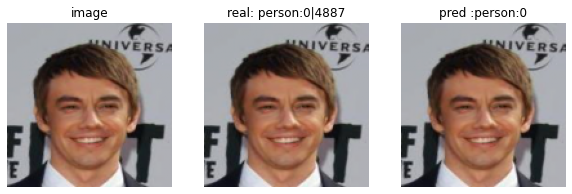

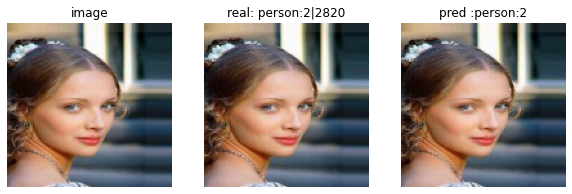

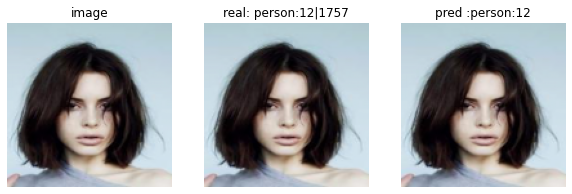

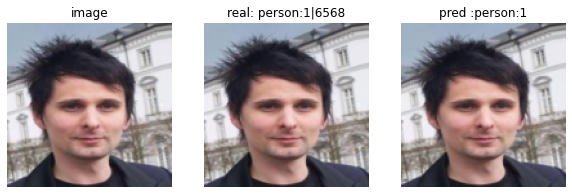

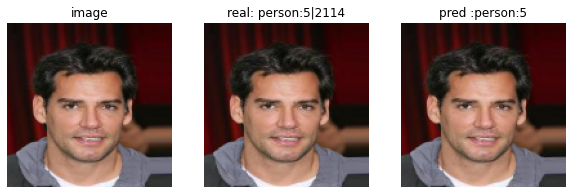

...

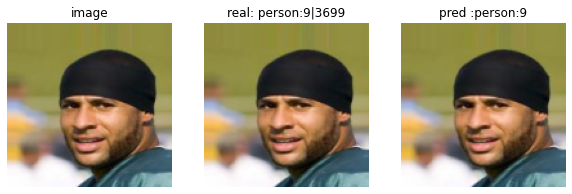

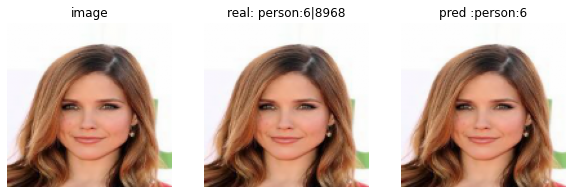

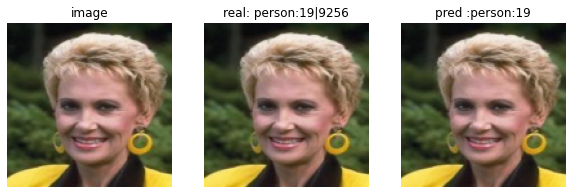

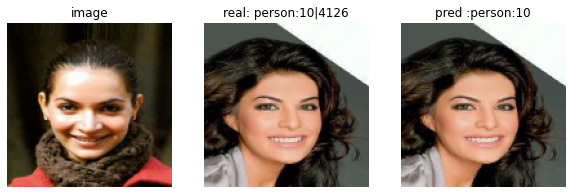

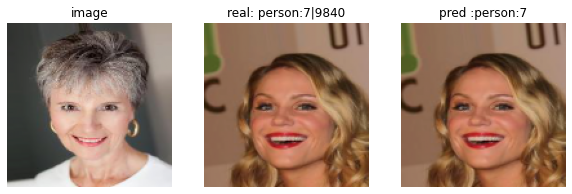

erros


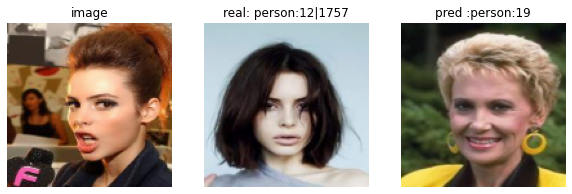

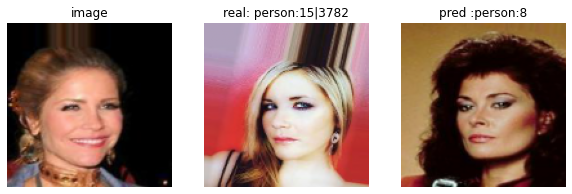

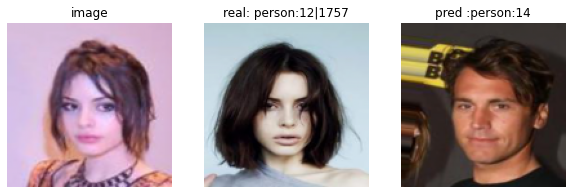

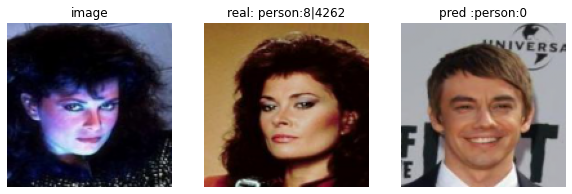

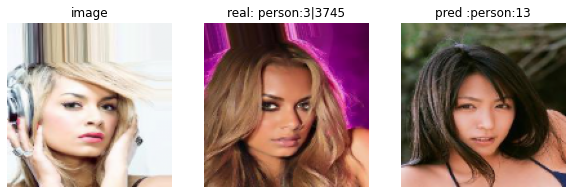

...

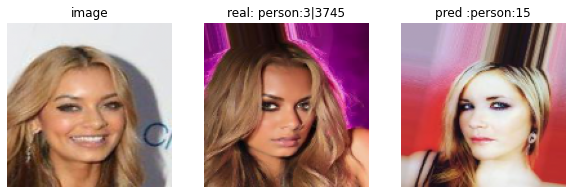

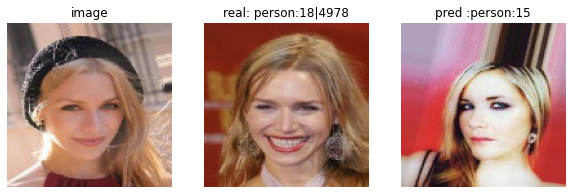

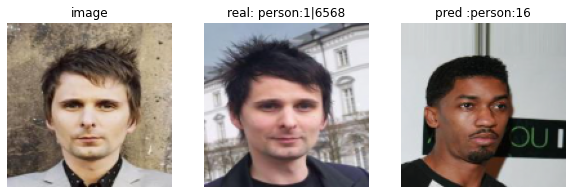

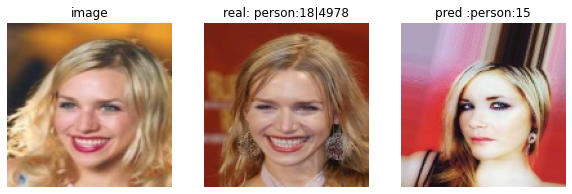

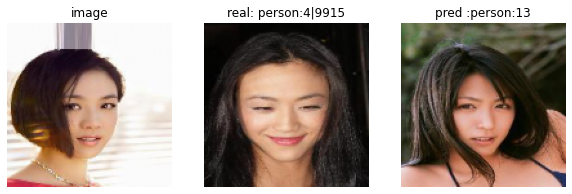

In [153]:
evalute_classifier_preds(y_train_n, X_train_pca,save_as_db_treino=True)

100%|██████████| 202600/202600 [00:02<00:00, 91581.89it/s]


acertos


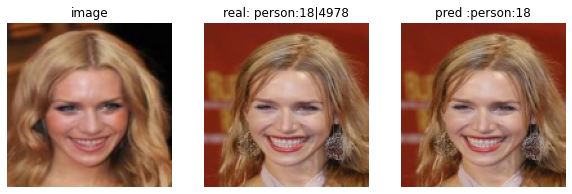

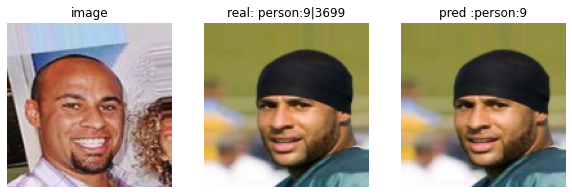

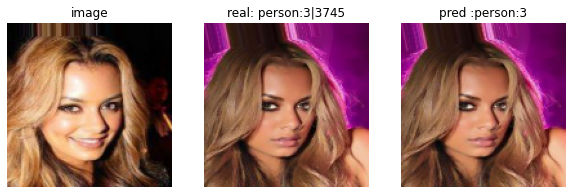

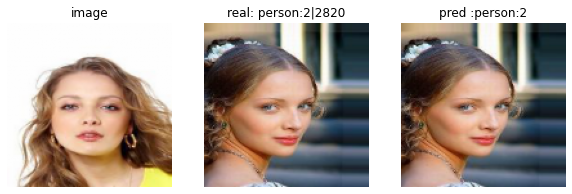

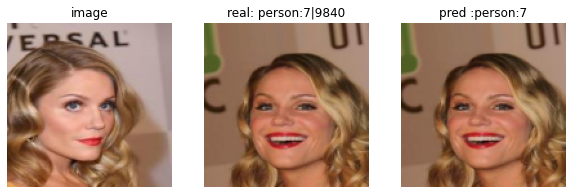

...

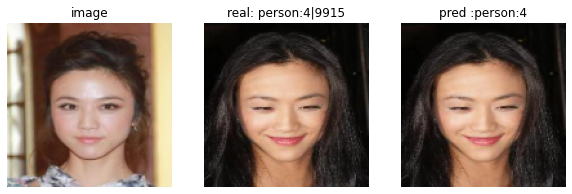

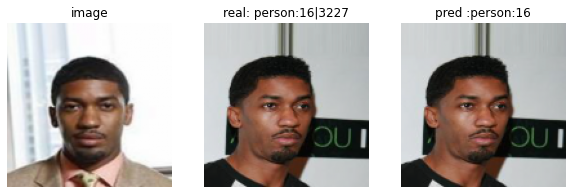

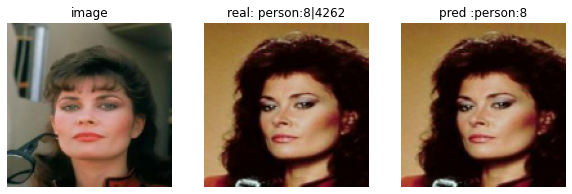

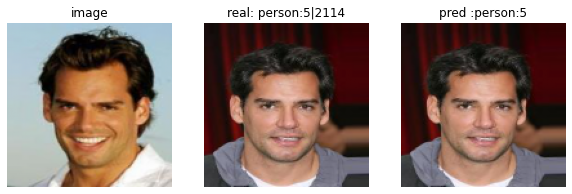

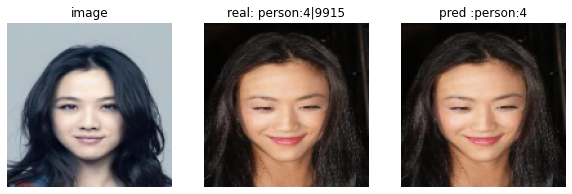

erros


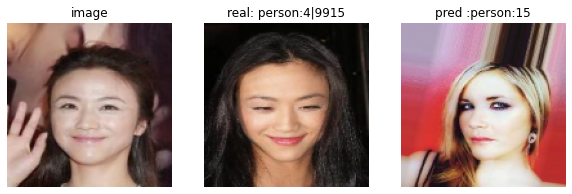

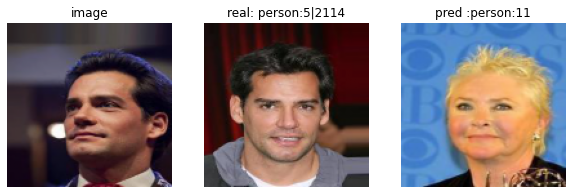

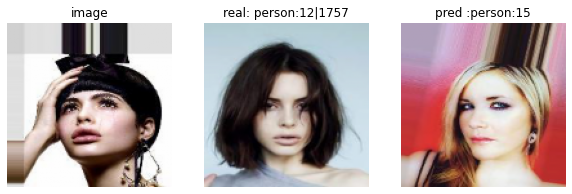

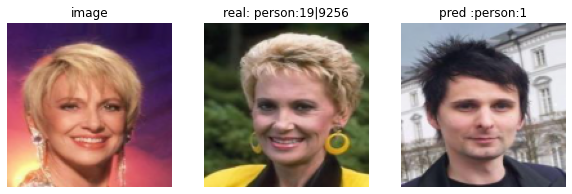

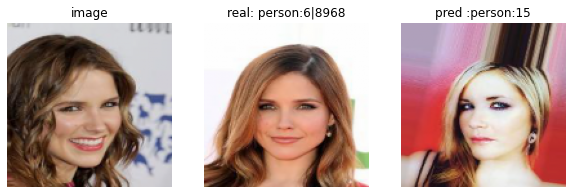

...

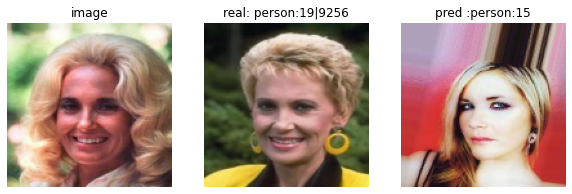

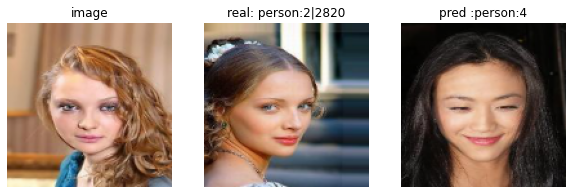

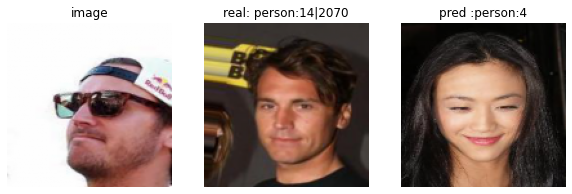

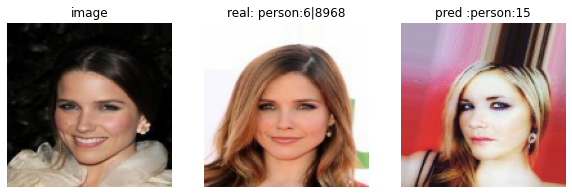

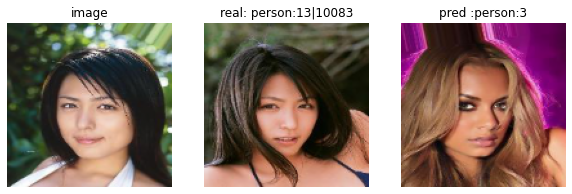

In [127]:
evalute_classifier_preds(y_test_n, X_test_pca)

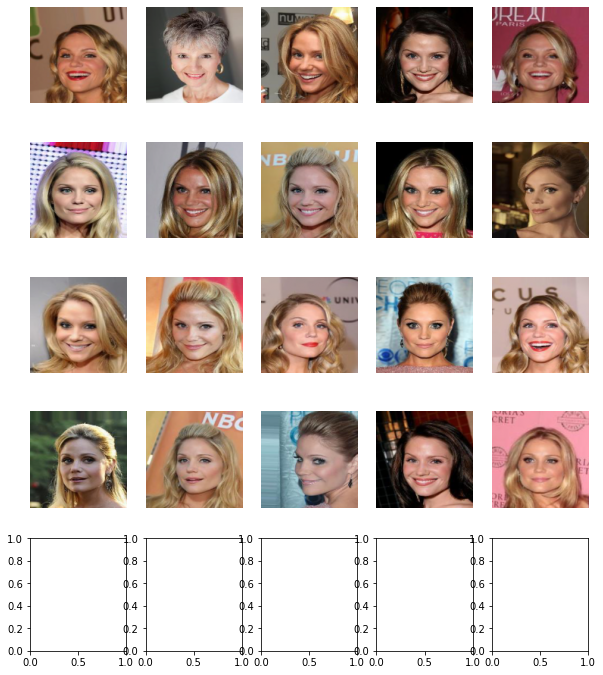

In [130]:
fig, axes = plt.subplots(5,5, figsize=(10,12))

for (i,row), ax in zip(db_treino[db_treino['classe_oficial']==9840][['images']].head(25).iterrows(), axes.ravel()): 
  ax.axis('off')
  ax.imshow(row['images'], cmap=plt.cm.gray)